# Segmentation with U-Net + Prediction Proyect (BWH)

# 1) U-Net Structure

In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import SimpleITK as sitk
%matplotlib inline

In [2]:
from keras.models import Model, model_from_json
from keras.layers import Input, merge, Convolution2D, MaxPooling2D, UpSampling2D, Dropout, Activation, Flatten
from keras.optimizers import Adam, SGD
from keras.metrics import binary_crossentropy, mean_absolute_error, fbeta_score, categorical_crossentropy
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, CSVLogger, BaseLogger, Callback, EarlyStopping, TensorBoard, LambdaCallback, ReduceLROnPlateau
from keras import backend as K
from keras.utils.np_utils import to_categorical

Using TensorFlow backend.


------------------

## Reading Data

CTSlices Shape: 
(4330, 512, 512)
Labels Shape: 
(4330, 512, 512)


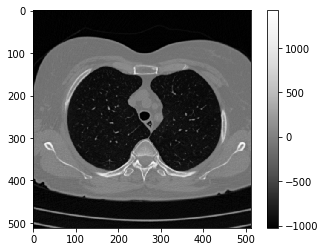

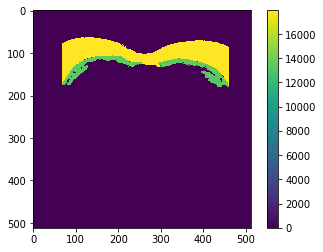

[    0 13335 13336 13591 13592 17943 17944]


In [3]:
folder = '/home/rmoreta/Projects/PectoralisSegmentation/Data/ProjectData_clean/'
num_files = [3,4,5] # 7 nrrd files in total

CTSlices = []
labels = []
# Reading CT

for i in num_files:
    if i == num_files[0]:
        # CTSlices
        file_name_CT = 'Cont_' + str(i+1) + '_clean.nrrd'#'_clean.nrrd'
        image_nrrd = sitk.ReadImage(folder + file_name_CT)
        CTSlices = sitk.GetArrayFromImage(image_nrrd)
        # Labels
        file_name_label = 'Cont_lm_' + str(i+1) + '_clean.nrrd'
        image_nrrd = sitk.ReadImage(folder + file_name_label)
        labels = sitk.GetArrayFromImage(image_nrrd)
    else:
        # CTSlices
        file_name_CT = 'Cont_' + str(i+1) + '_clean.nrrd'
        image_nrrd = sitk.ReadImage(folder + file_name_CT)
        CTSlices_aux = sitk.GetArrayFromImage(image_nrrd)
        CTSlices = np.concatenate((CTSlices, CTSlices_aux), axis = 0)
        # Labels
        file_name_label = 'Cont_lm_' + str(i+1) + '_clean.nrrd'
        image_nrrd = sitk.ReadImage(folder + file_name_label)
        labels_aux = sitk.GetArrayFromImage(image_nrrd)
        labels = np.concatenate((labels, labels_aux), axis = 0)
        
print('CTSlices Shape: ')
print(CTSlices.shape)

print('Labels Shape: ')
print(labels.shape)

# num_labels = np.unique(labels)

# Image Representation
slice_num = 300
ToraxSlice = CTSlices[slice_num,:,:]
plt.figure()
plt.imshow(ToraxSlice,cmap='Greys_r')
plt.colorbar()
plt.show()

LabelToraxSlice = labels[slice_num,:,:]
plt.figure()
plt.imshow(LabelToraxSlice)
plt.colorbar()
plt.show()
print(np.unique(LabelToraxSlice))

------------------

## Pre-Processing Data

**Normalizing**

In [4]:
numpy_array = CTSlices.astype(np.float32)
numpy_array[numpy_array < -1024] = -1024
numpy_array[numpy_array > 1500] = 1500
numpy_array = (numpy_array + 1024) / (1500 + 1024) - 0.5

CTSlices_new = numpy_array
print(CTSlices_new.shape)

(4330, 512, 512)


**Selecting Labels**

Pectorals Labels

In [5]:
num_classes = 3

array([0, 1, 2, 3, 4, 5, 6], dtype=int16)

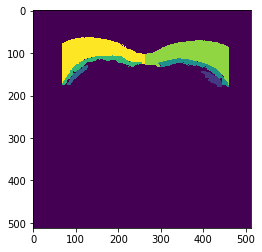

In [20]:
num_classes = 7

labels[(labels!=13335)&(labels!=13336)&(labels!=13591)&(labels!=13592)&(labels!=17943)&(labels!=17944)] = 0
labels[(labels==13335)] = 1 # Left Minor Pectoral
labels[(labels==13336)] = 2 # Right Minor Pectoral
labels[(labels==13591)] = 3 # Left Major Pectoral
labels[(labels==13592)] = 4 # RIght Major Pectoral
labels[(labels==17943)] = 5 # Left Fat 
labels[(labels==17944)] = 6 # Right Fat 
plt.figure()
plt.imshow(labels[slice_num,:,:])
np.unique(labels[slice_num,:,:])

In [6]:
#plt.figure()
#plt.imshow(labels[300,:,:])
#plt.savefig('Figures/Multiclass/lables_example.png')

(4330, 512, 512, 7)


/home/rmoreta/anaconda2/envs/tensorflow/lib/python2.7/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


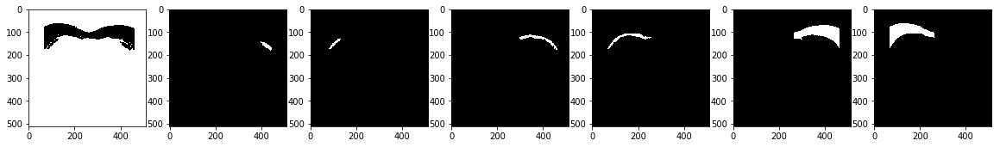

In [6]:
labels_cat = (np.arange(num_classes) == labels[:,:,:,None])
print(labels_cat.shape)

f, a = plt.subplots(1, num_classes, figsize=(20, 20))
for i in range(num_classes):
    a[i].imshow(labels_cat[slice_num,:,:,i],cmap='Greys_r')
f.show()
plt.draw()

In [9]:
#f.savefig('Figures/Multiclass/subplot_lables.png')

Fat

In [10]:
#labels[(labels!=17943)&(labels!=17944)] = 0
#labels[(labels==17943)] = 1 # Right Fat (image)
#labels[(labels==17944)] = 1 # Left Fat (image)
#plt.figure()
#plt.imshow(labels[slice_num,:,:])
#np.unique(labels[slice_num,:,:])

-----------------

## Spliting data in Training And Testing

In [6]:
img_rows = 512 # Divisible por 16
img_cols = 512

In [7]:
num_images_train = 0
num_images_test = 3000

train_dataset = CTSlices_new[0 : num_images_train,:,:]
#train_labels = labels_cat[0 : num_images_train,:,:]
test_dataset = CTSlices_new[num_images_train : num_images_train+num_images_test,:,:]
#test_labels = labels_cat[num_images_train : num_images_train+num_images_test,:,:]

print(train_dataset.shape)
#print(train_labels.shape)
print(test_dataset.shape)
#print(test_labels.shape)

(0, 512, 512)
(3000, 512, 512)


--------------

## U-net Structure

----------

## Train

In [11]:
#img_rows = 512
#img_cols = 512
smooth = 1.

imgs_train = np.reshape(train_dataset,(num_images_train, img_rows, img_cols, 1))
imgs_mask_train = np.reshape(train_labels,(num_images_train, img_rows, img_cols, num_classes))

total = imgs_train.shape[0]

print('Taining Shape:', imgs_train.shape)
print('Training Mask Shape:', imgs_mask_train.shape)

('Taining Shape:', (1400, 512, 512, 1))
('Training Mask Shape:', (1400, 512, 512, 2))


In [14]:
model = get_unet()

U-net Initialized


#### Open trained U-net Model

    unet_GPU_multiclass_nc3_500im_17ep_lr001.hdf5
    unet_GPU_multiclass_nc5_1400im_16ep_lr001
    unet_GPU_multiclass_nc5_500im_6ep_lr001

In [10]:
from keras import models as models

In [24]:
num_classes = 3

In [10]:
path_unet = '/home/rmoreta/Projects/PectoralisSegmentation/Results/CARS_presentation/'
name_unet = 'unet_nc3_fat_3000im_13ep.hdf5'

In [23]:
model = models.load_model(path_unet + name_unet)


-----------------

## Test

In [8]:
#img_rows = 512
#img_cols = 512

imgs_test = np.reshape(test_dataset,(num_images_test, img_rows, img_cols, 1))
#imgs_mask_test = np.reshape(test_labels,(num_images_test, img_rows, img_cols, num_classes))

print('Test Shape: ', imgs_test.shape)
print('Test Mask Shape: ', imgs_mask_test.shape)

('Test Shape: ', (3000, 512, 512, 1))


NameError: name 'imgs_mask_test' is not defined

In [38]:
# Test Prediction
print('Test Prediction')
imgs_mask_pred = model.predict(imgs_test, verbose=1)

# Test
print('Test Evaluation')
test_evaluation = model.evaluate(imgs_test, imgs_mask_test, verbose=1)

# Saving prediction results
np.save(path_unet + 'imgs_mask_pred_test_fat_CARS_3000.npy', imgs_mask_pred)

print('Test loss:', test_evaluation[0])
print('Test accuracy:', test_evaluation[1])

Test Prediction
3000/3000 [==============================] - 64s     

#### Join pecs and fat pred

In [5]:
imgs_mask_pred_pecs = np.load(path_unet + 'imgs_mask_pred_test_pecs_CARS_3000.npy')
imgs_mask_pred_fat = np.load(path_unet + 'imgs_mask_pred_test_fat_CARS_3000.npy')

In [15]:
imgs_mask_pred = np.concatenate((imgs_mask_pred_pecs[:,:,:,range(1,5)], imgs_mask_pred_fat[:,:,:,[1,2]]), axis = 3)

In [16]:
np.save(path_unet + 'imgs_mask_pred_test_pecs&fat_3000.npy', imgs_mask_pred)

In [11]:
imgs_mask_pred = np.load(path_unet + 'imgs_mask_pred_pecs&fat_label.npy')
imgs_mask_pred.shape

(3000, 512, 512, 6)

In [12]:
imgs_mask_test = np.load(path_unet + 'imgs_mask_test_pecs&fat_label.npy')
imgs_mask_test.shape

(3000, 512, 512, 6)

------------

In [15]:
imgs_mask_test = imgs_mask_test[:,:,:,range(1,7)]
np.save(path_unet + 'imgs_mask_test_pecs&fat_label.npy',imgs_mask_test)

-----------------------

In [27]:
auxiliar = np.copy(imgs_mask_pred)

In [6]:
th = 0.5
#imgs_mask_pred = np.copy(auxiliar)
imgs_mask_pred[(imgs_mask_pred > th)] = 1
imgs_mask_pred[(imgs_mask_pred < th)] = 0

In [7]:
imgs_mask_pred = imgs_mask_pred.astype('int8')

In [36]:
labels_closed_cat = np.zeros((50,512,512,num_classes-1))
for i,ii in enumerate([1,2,3,4]):
    for j in range(50):
        aux = sitk.GetImageFromArray(imgs_mask_pred[j,:,:,ii])
        imgs_mask_pred[j,:,:,i] = sitk.GetArrayFromImage(sitk.BinaryFillhole(aux))


In [ ]:
j = 40
ii = 1

plt.figure()
plt.imshow(imgs_mask_pred[j,:,:,ii])
plt.figure()
plt.imshow(labels_closed_cat[j,:,:,ii-1])


In [ ]:
imgs_mask_pred_join = np.zeros(labels_closed_cat.shape[0:-1])
class_code = [5,6]

for i in np.linspace(num_classes - 1, 1, num_classes - 1, dtype='int16'):
    imgs_mask_pred_join = unify_labels(labels_closed_cat[:, :, :, i-1], imgs_mask_pred_join, class_code[i-1])

In [ ]:
plt.figure()
plt.imshow(imgs_mask_pred_join[40,:,:])

----------------

## Results

In [16]:
#imgs_mask_pred = np.load('imgs_mask_pred_ADAM-lr=001__loss=binary_crossentropy.npy')
np.unique(imgs_mask_pred)

array([0, 1], dtype=int16)

In [ ]:
print(np.unique(np.sum(imgs_mask_pred,axis=3)))
print(np.sum(imgs_mask_pred[:,:,:,2]*imgs_mask_pred[:,:,:,0]))


### Test Results

*PEcs Class*

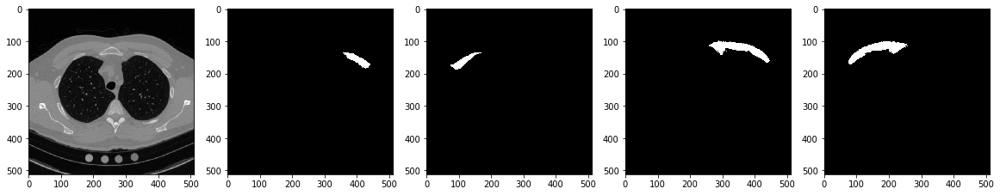

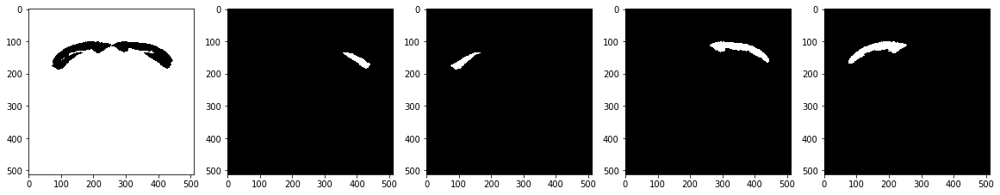

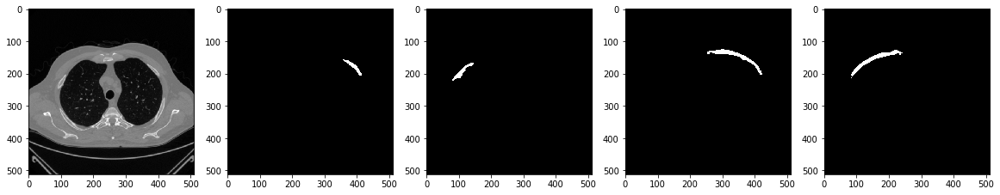

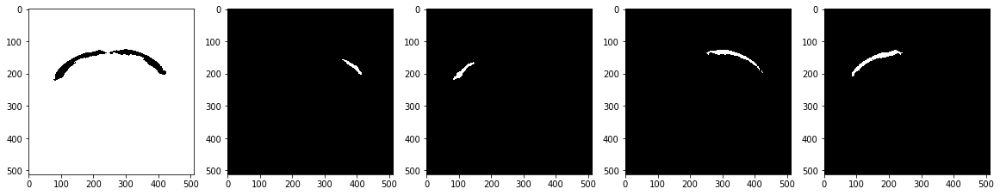

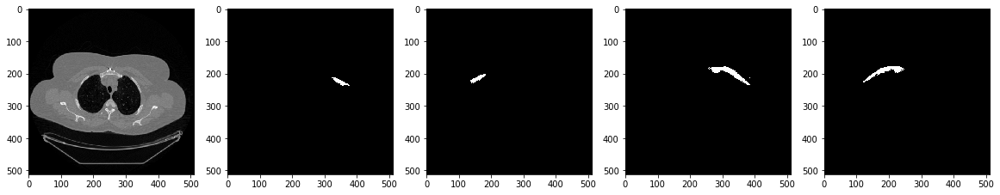

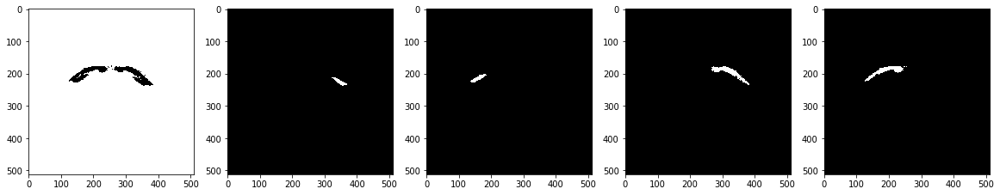

In [17]:
for i in [0,1000,2999]:
    f, a = plt.subplots(1, num_classes, figsize=(20, 20))
    f2, a2 = plt.subplots(1, num_classes, figsize=(20, 20))
    a[1].imshow(imgs_mask_test[i,:,:,1], cmap='Greys_r')
    a[2].imshow(imgs_mask_test[i,:,:,2], cmap='Greys_r')
    a[0].imshow(imgs_test[i,:,:,0], cmap='Greys_r')
    a[3].imshow(imgs_mask_test[i,:,:,3], cmap='Greys_r')
    a[4].imshow(imgs_mask_test[i,:,:,4], cmap='Greys_r')
    
    a2[0].imshow(imgs_mask_pred[i,:,:,0], cmap='Greys_r')
    a2[1].imshow(imgs_mask_pred[i,:,:,1], cmap='Greys_r')
    a2[2].imshow(imgs_mask_pred[i,:,:,2], cmap='Greys_r')
    a2[3].imshow(imgs_mask_pred[i,:,:,3], cmap='Greys_r')
    a2[4].imshow(imgs_mask_pred[i,:,:,4], cmap='Greys_r')
    f.show()
    f2.show()
    plt.draw()

*Fat*

/home/rmoreta/anaconda2/envs/tensorflow/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


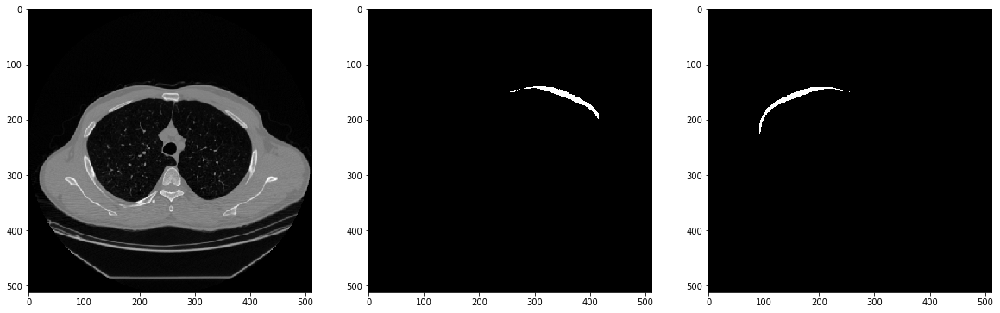

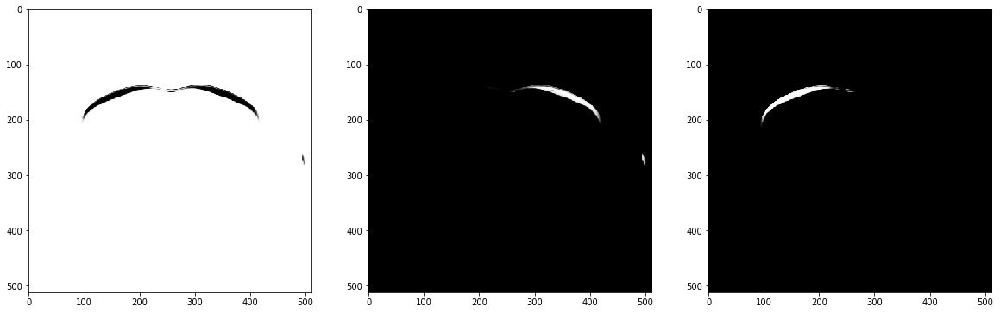

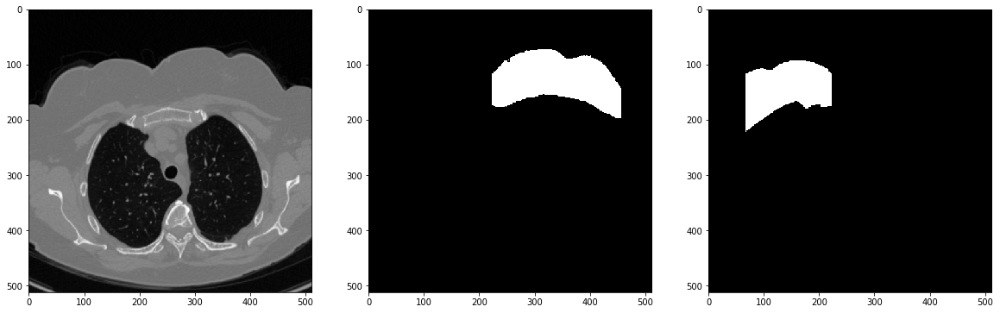

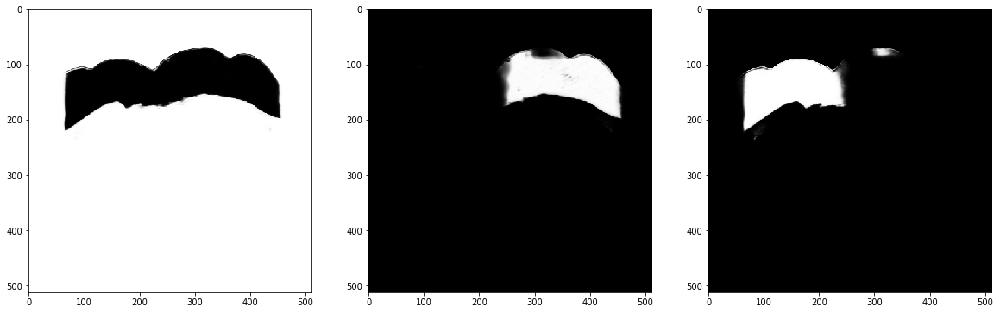

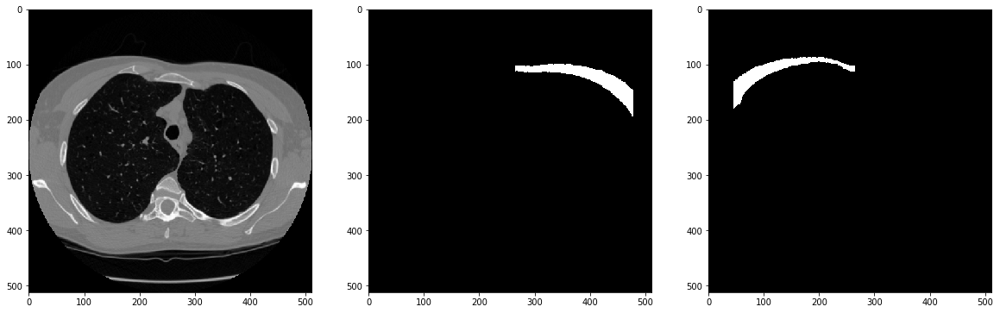

...

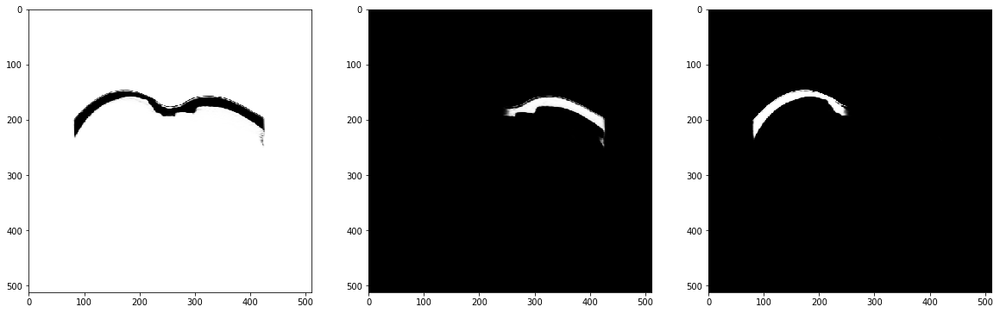

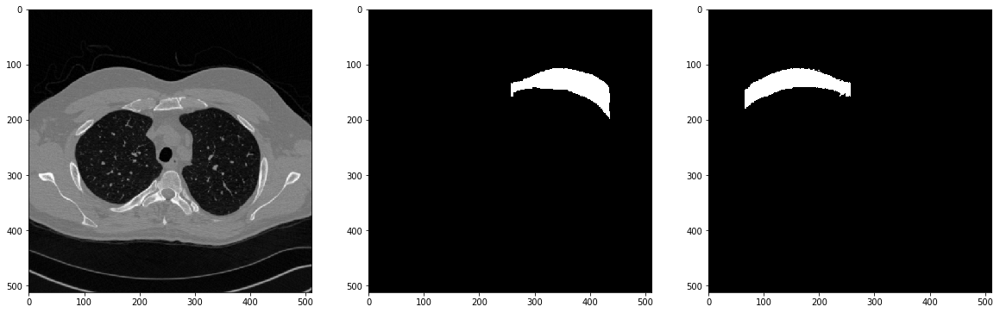

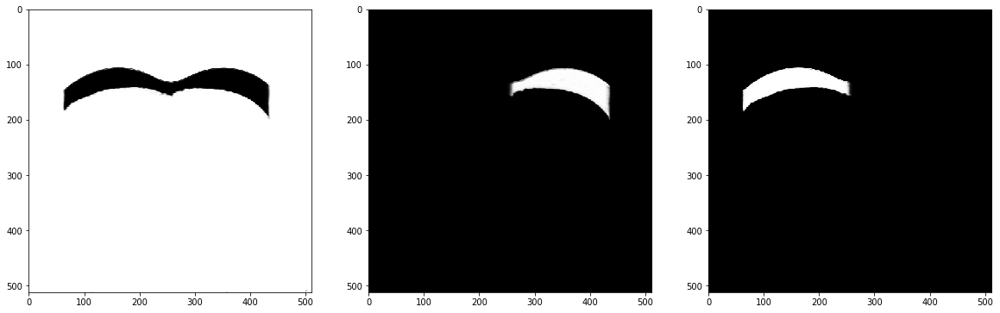

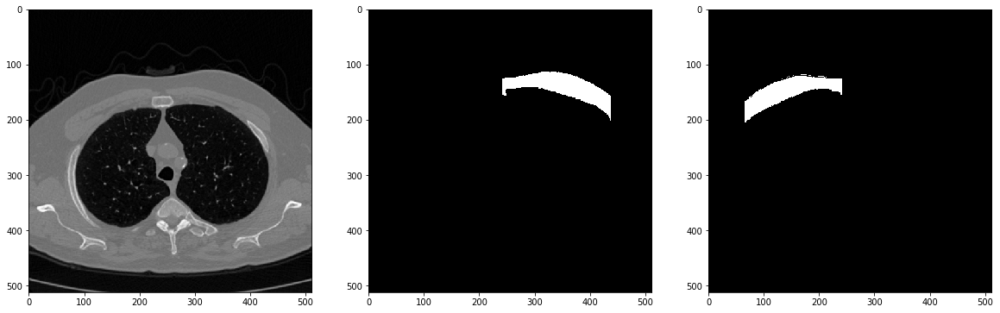

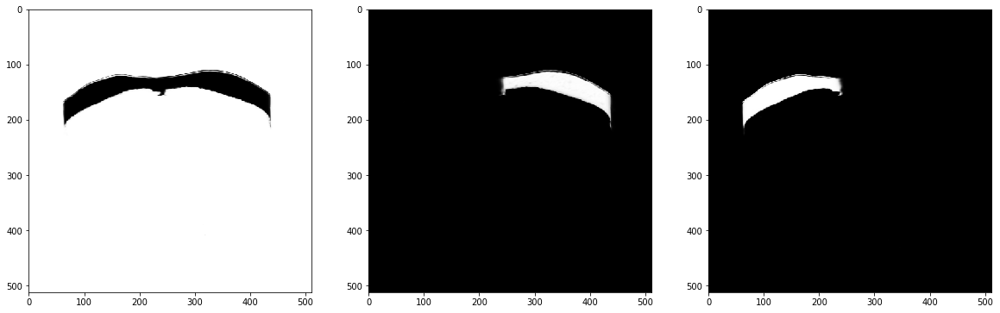

In [21]:
for i in range(20):
    f, a = plt.subplots(1, num_classes, figsize=(20, 20))
    f2, a2 = plt.subplots(1, num_classes, figsize=(20, 20))
    a[1].imshow(imgs_mask_test[i,:,:,1], cmap='Greys_r')
    a[2].imshow(imgs_mask_test[i,:,:,2], cmap='Greys_r')
    a[0].imshow(imgs_test[i,:,:,0], cmap='Greys_r')
    #a[3].imshow(imgs_mask_test[i,:,:,3], cmap='Greys_r')
    #a[4].imshow(imgs_mask_test[i,:,:,4], cmap='Greys_r')
    
    a2[0].imshow(imgs_mask_pred[i,:,:,0], cmap='Greys_r')
    a2[1].imshow(imgs_mask_pred[i,:,:,1], cmap='Greys_r')
    a2[2].imshow(imgs_mask_pred[i,:,:,2], cmap='Greys_r')
    #a2[3].imshow(imgs_mask_pred[i,:,:,3], cmap='Greys_r')
    #a2[4].imshow(imgs_mask_pred[i,:,:,4], cmap='Greys_r')
    f.show()
    f2.show()
    plt.draw()

*Fat and Pecs*

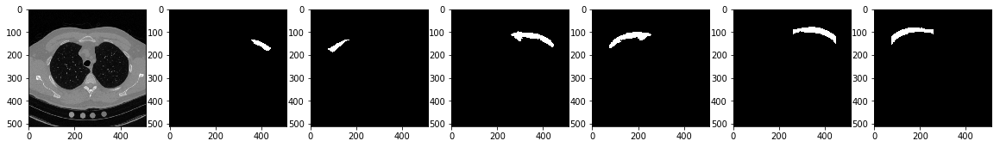

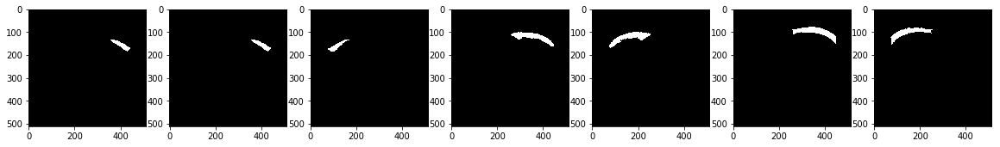

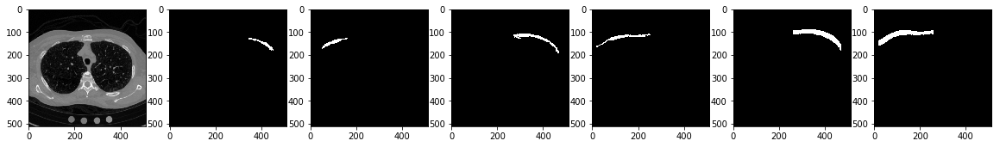

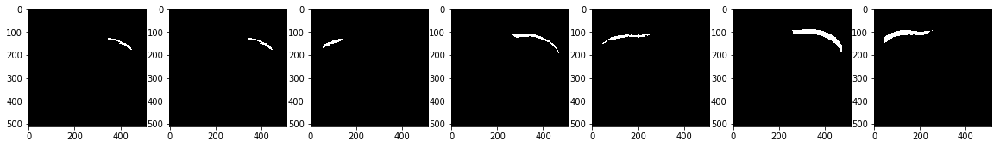

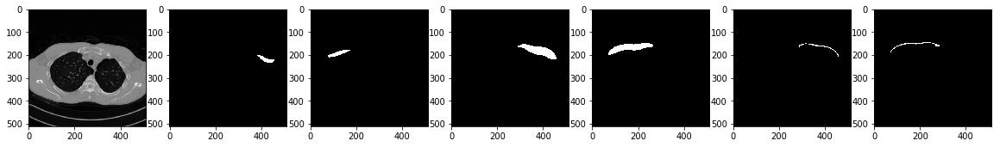

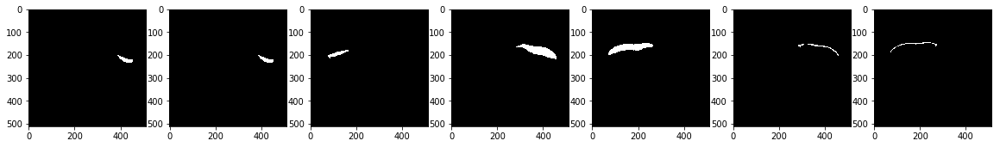

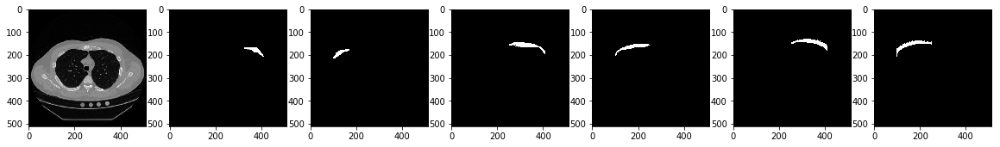

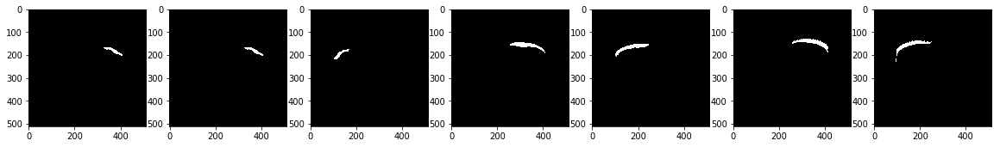

In [16]:
for i in [0,1,4,6]:
    f, a = plt.subplots(1, num_classes, figsize=(20, 20))
    f2, a2 = plt.subplots(1, num_classes, figsize=(20, 20))
    a[1].imshow(imgs_mask_test[i,:,:,1], cmap='Greys_r')
    a[2].imshow(imgs_mask_test[i,:,:,2], cmap='Greys_r')
    a[0].imshow(imgs_test[i,:,:,0], cmap='Greys_r')
    a[3].imshow(imgs_mask_test[i,:,:,3], cmap='Greys_r')
    a[4].imshow(imgs_mask_test[i,:,:,4], cmap='Greys_r')
    a[5].imshow(imgs_mask_test[i,:,:,5], cmap='Greys_r')
    a[6].imshow(imgs_mask_test[i,:,:,6], cmap='Greys_r')
    
    a2[0].imshow(imgs_mask_pred[i,:,:,0], cmap='Greys_r')
    a2[1].imshow(imgs_mask_pred[i,:,:,0], cmap='Greys_r')
    a2[2].imshow(imgs_mask_pred[i,:,:,1], cmap='Greys_r')
    a2[3].imshow(imgs_mask_pred[i,:,:,2], cmap='Greys_r')
    a2[4].imshow(imgs_mask_pred[i,:,:,3], cmap='Greys_r')
    a2[5].imshow(imgs_mask_pred[i,:,:,4], cmap='Greys_r')
    a2[6].imshow(imgs_mask_pred[i,:,:,5], cmap='Greys_r')
    
    f.show()
    f2.show()
    plt.draw()

In [ ]:
import scipy.misc

*Join Together*

In [25]:
def unify_labels(labels, labels_unique, code):
    condition = (labels == 1)
    index = np.where(condition)
    labels_unique[index] = code

    return labels_unique

In [19]:
imgs_mask_pred_join = np.zeros(imgs_mask_pred.shape[0:-1])
class_code = [1,2,3,4,5,6]

for i in np.linspace(num_classes - 1, 1, num_classes - 1, dtype='int16'):
    imgs_mask_pred_join = unify_labels(imgs_mask_pred[:, :, :, i], imgs_mask_pred_join, class_code[i-1])

In [82]:
imgs_mask_pred_join = np.zeros(imgs_mask_pred.shape[0:-1], dtype='int8')
class_code = [1,2,3,4,5,6]
num_classes = 6

for i in np.linspace(num_classes-1, 0, num_classes, dtype='int16'):
    print i
    imgs_mask_pred_join = unify_labels(imgs_mask_pred[:, :, :, i], imgs_mask_pred_join, class_code[i])

5
4
3
2
1
0


In [267]:
np.save(path_unet + 'imgs_mask_pred_pecs&fat_join.npy', imgs_mask_pred_join)

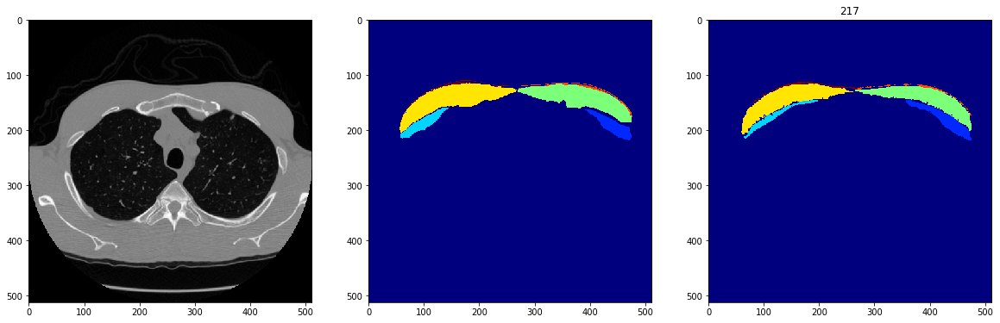

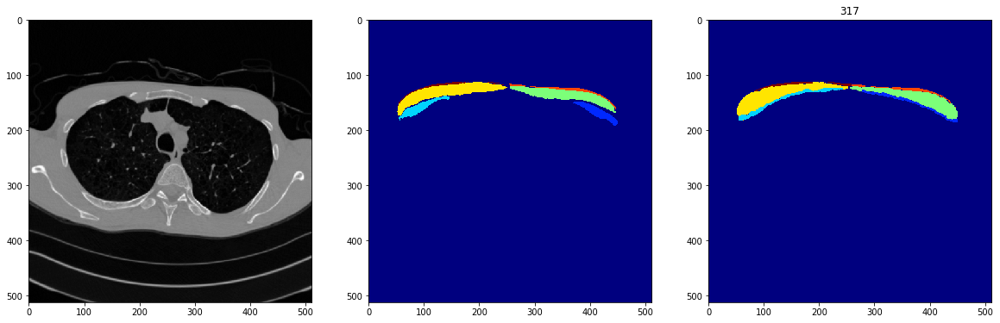

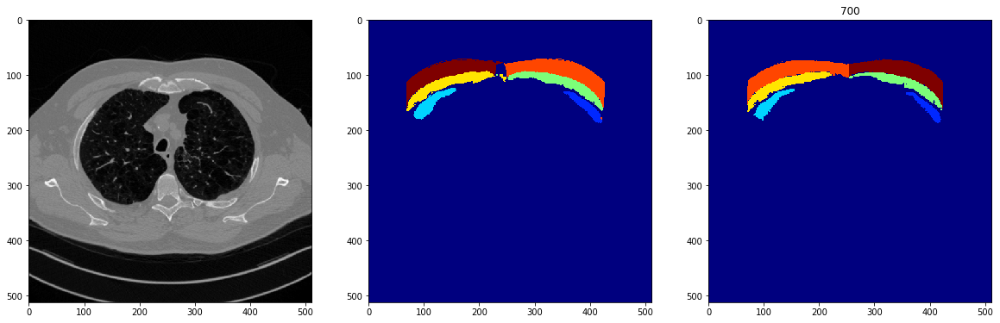

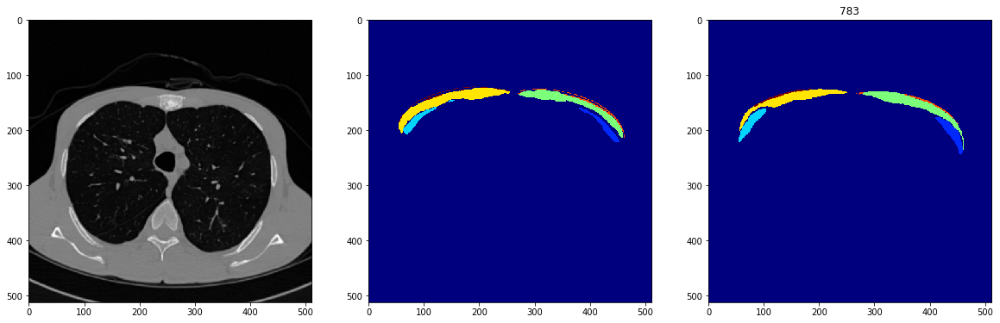

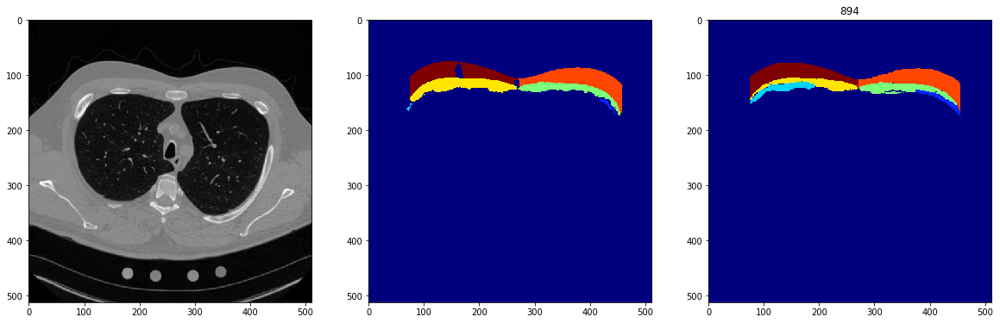

...

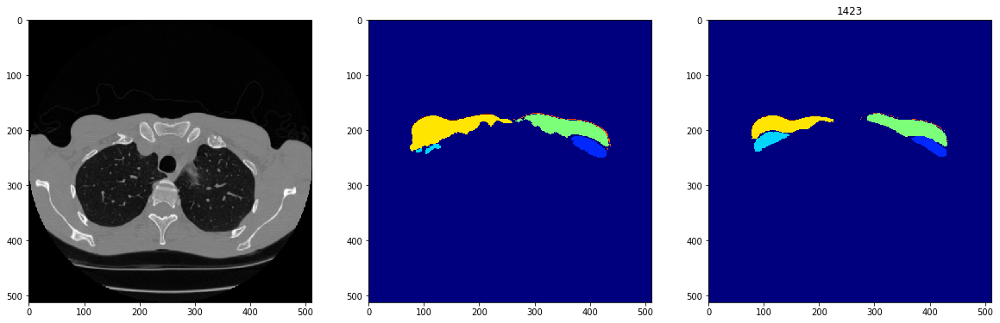

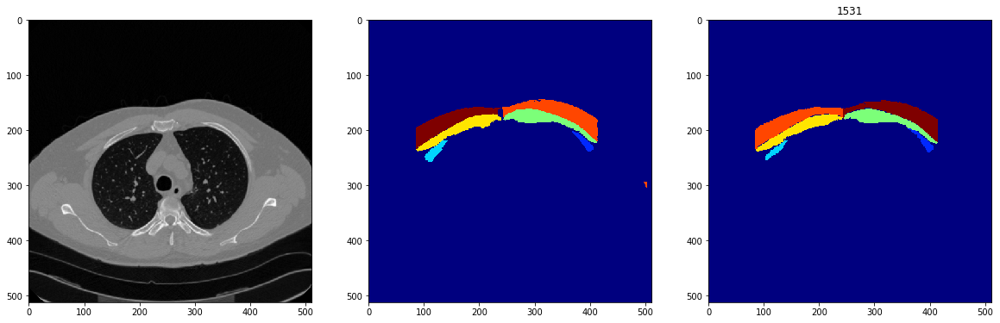

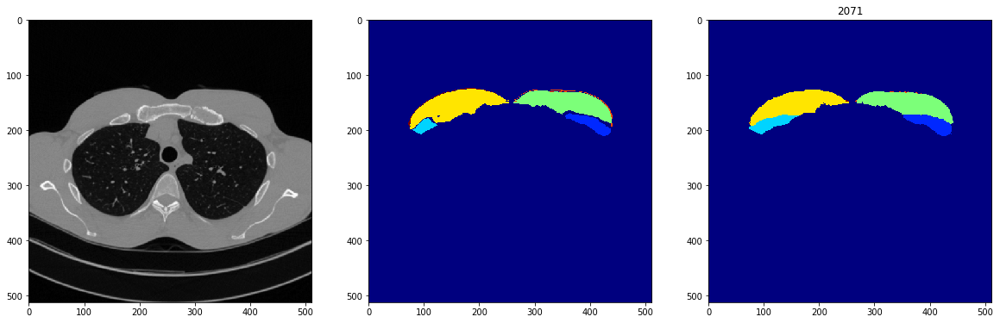

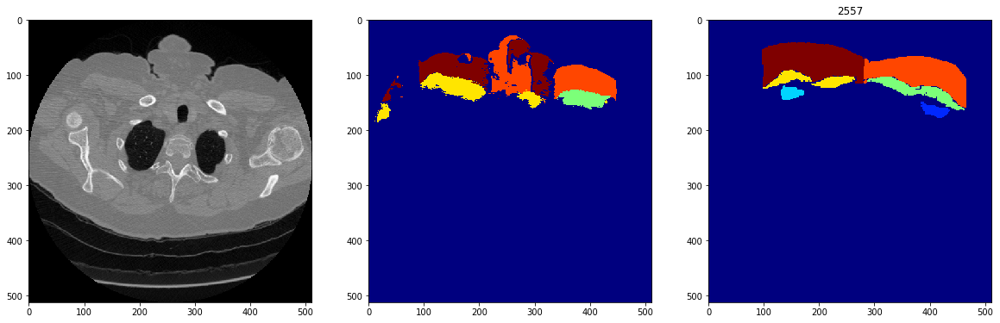

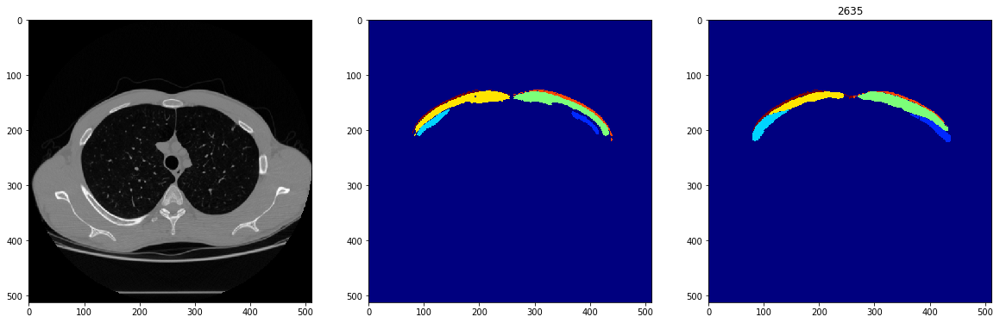

In [89]:
for i in images_bad_classes:
    f, a = plt.subplots(1, 3, figsize=(20, 20))
    a[1].imshow(imgs_mask_pred_join[i,:,:],'jet')
    a[2].imshow(labels[num_images_train+i,:,:],'jet')
    a[0].imshow(imgs_test[i,:,:,0],cmap='Greys_r')
    f.show()
    plt.title(str(i))
    plt.draw()
    #plt.savefig(path_unets + 'Figures/all_subplot_good{}.png'.format(i))
    #scipy.misc.imsave('Figures/Multiclass/Best/all_mask_pred_{}.png'.format(i),imgs_mask_pred[i,:,:,0])
    #scipy.misc.imsave('Figures/Multiclass/Best/all_test_{}.png'.format(i),imgs_mask_test[i,:,:,0])
    #scipy.misc.imsave('Figures/Multiclass/Best/all_mask_test{}.png'.format(i),imgs_test[i,:,:,0])

------------------

In [19]:
def get_edge(image, edge_size):
    aux = sitk.GetImageFromArray(image*1)
    edge = sitk.GetArrayFromImage(sitk.BinaryErode(aux,edge_size))
    edge = image-edge
    
    return edge

In [27]:
def get_edge_classes(image_mask, edge_size):
    image_mask_join = np.zeros(image_mask.shape[0:-1], dtype='int8')
    class_code = [1,2,3,4,5,6]
    num_classes = len(class_code)
    
    edge = np.zeros(image_mask.shape, dtype='int8')
    
    for i in range(num_classes):
        edge[:,:,i] = get_edge(image_mask[:,:,i], edge_size)
    
    for i in np.linspace(num_classes-1, 0, num_classes, dtype='int8'):
        image_mask_join = unify_labels(edge[:, :, i], image_mask_join, class_code[i])
        
    return image_mask_join

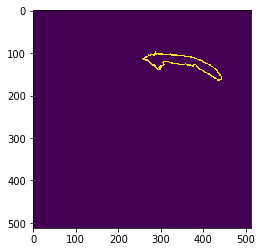

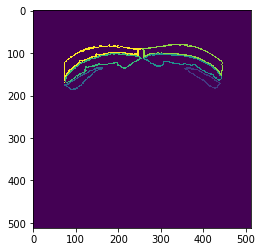

In [28]:
image = imgs_mask_test[0,:,:,2]
edge = get_edge(image,3)
plt.figure()
plt.imshow(edge)

image = imgs_mask_pred[0,:,:]
plt.figure()
plt.imshow(get_edge_classes(image,3))

## Figures CARS

In [21]:
imgs_mask_pred_join = np.load(path_unet + 'imgs_mask_pred_pecs&fat_join.npy')

In [54]:
acc_test_image = np.load(path_unet + 'acc_test_image.npy')


In [31]:
def detect_min_max(mask, mask_pred, margen):
    
    aux = np.where(mask != 0)
    min_h1, max_h1 = aux[0].min(), aux[0].max()
    min_w1, max_w1 = aux[1].min(), aux[1].max()
    
    aux = np.where(mask_pred != 0)
    min_h2, max_h2 = aux[0].min(), aux[0].max()
    min_w2, max_w2 = aux[1].min(), aux[1].max()
    
    min_h, max_h = min(min_h1, min_h2)-margen, max(max_h1, max_h2)+margen
    min_w, max_w = min(min_w1, min_w2)-margen, max(max_w1, max_w2)+margen
    
    if min_h < 0: min_h = 1
    if min_w < 0: min_w = 1
    if max_h > 511: max_h = 510
    if max_w >511: max_w = 510
    
    return min_h, max_h, min_w, max_w

#### Intro

In [32]:
path_figure = path_unet + 'figures/'

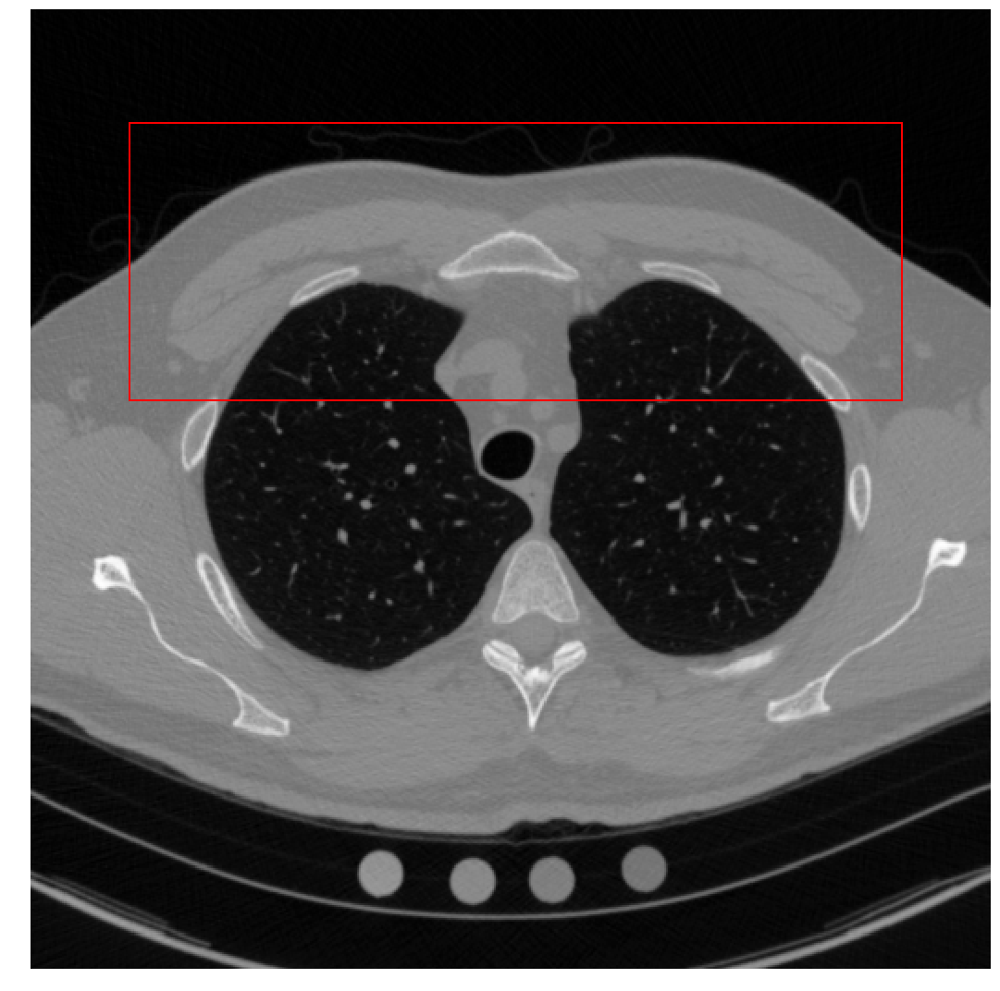

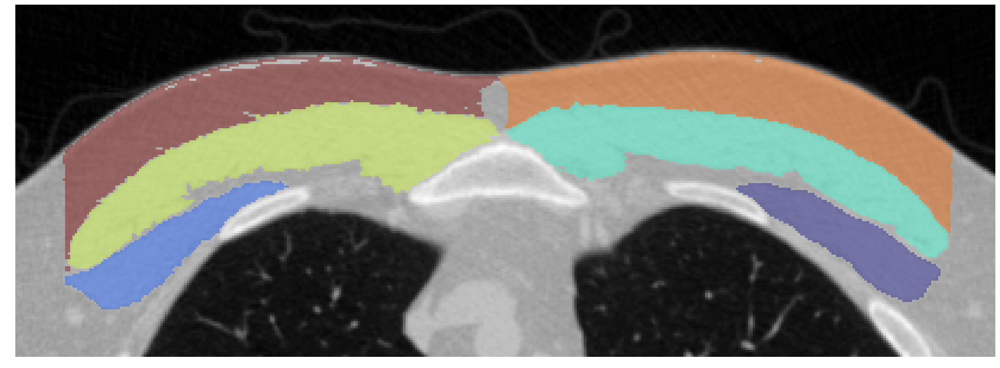

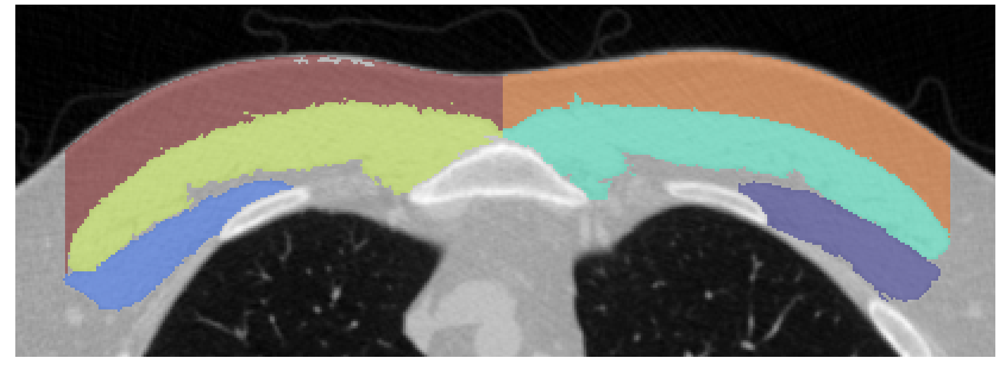

In [44]:
for i in [0]:
    
    margen = 20
    
    min_h, max_h, min_w, max_w = detect_min_max(labels[num_images_train+i,:,:], labels[num_images_train+i,:,:], margen)
    
    r_coord_0 = (min_w, min_h)
    r_width = max_w-min_w
    r_hight = max_h-min_h
    
    r_index_i, r_index_j = np.ix_(range(r_coord_0[1], r_coord_0[1]+r_hight), range(r_coord_0[0], r_coord_0[0]+r_width))
    
    CT_test = imgs_test[i,:,:,0]
    CT_test_r = imgs_test[i,r_index_i,r_index_j,0]
    
    CNN = imgs_mask_pred_join[i,r_index_i,r_index_j]
    CNN_masked = np.ma.masked_where(CNN == 0, CNN)
    GT = labels[num_images_train+i,r_index_i,r_index_j]
    GT_masked = np.ma.masked_where(GT == 0, GT)  
    
    opacity = 0.4
    
    acc_i = str(acc_test_image_mean[i])[2:4] + '\'' + str(acc_test_image_mean[i])[4:6]
    
    ## CT PLOT
    f, a = plt.subplots(1, 1, figsize=(15, 15))
    a.imshow(CT_test, cmap='Greys_r')
    rect = patches.Rectangle(r_coord_0, r_width, r_hight, linewidth=4, edgecolor='r', facecolor='none')
    a.add_patch(rect)
    a.axis('off')
    #a.set_title('CT ZOOM')
    plt.tight_layout()
    plt.savefig(path_figure + "fig_{}_{}_CT.png".format(acc_i,i), bbox_inches='tight')
    f.show()
    
    ## ZOOM PLOT CNN
    f, a = plt.subplots(1, 1, figsize=(30, 15)) 
    a.imshow(CT_test_r,cmap='Greys_r')
    a.imshow(CNN_masked, 'jet',interpolation='none', alpha=opacity)
    #a.set_title('CT ZOOM')
    a.axis('off')
    plt.tight_layout()
    plt.savefig(path_figure + "fig_{}_{}_CNN.png".format(acc_i,i), bbox_inches='tight')
    f.show()
    
    ## ZOOM PLOT GT
    f, a = plt.subplots(1, 1, figsize=(30, 15))
    a.imshow(CT_test_r,cmap='Greys_r')
    a.imshow(GT_masked, 'jet', interpolation='none', alpha=opacity)
    #a.set_title('CT ZOOM')
    a.axis('off')
    plt.tight_layout()
    plt.savefig(path_figure + "fig_{}_{}_GT.png".format(acc_i,i), bbox_inches='tight')
    f.show()


#### Results

In [38]:
import matplotlib.patches as patches

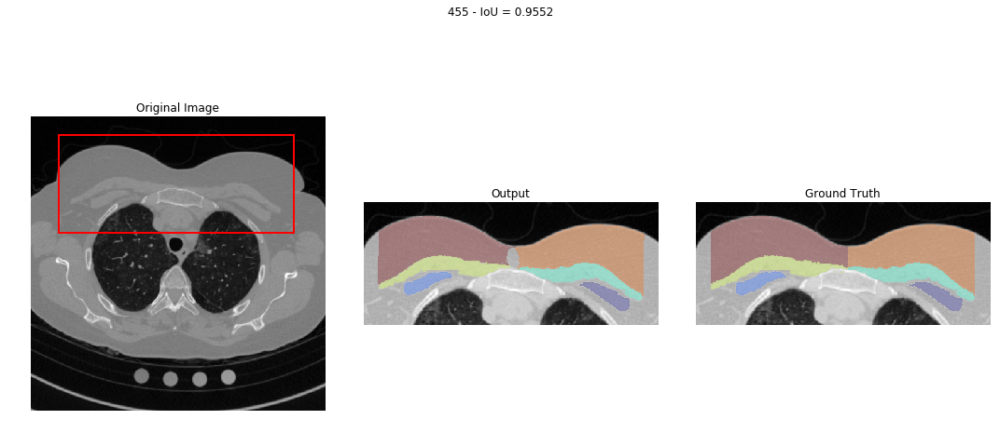

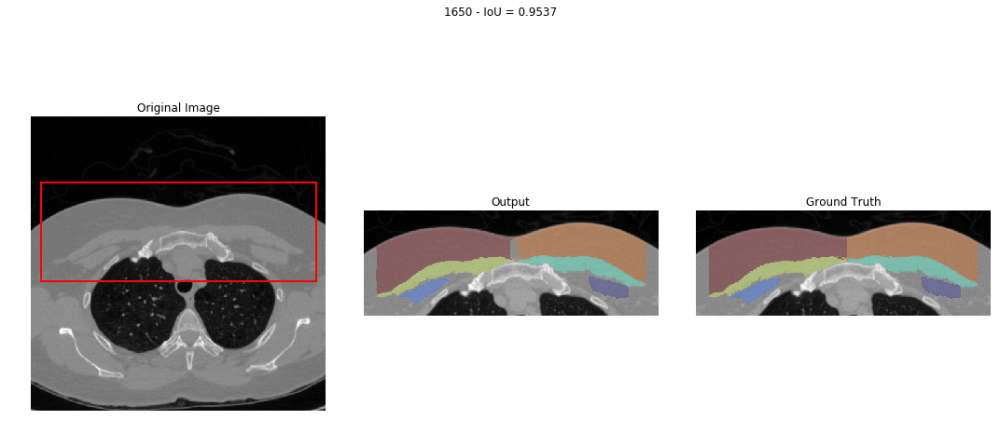

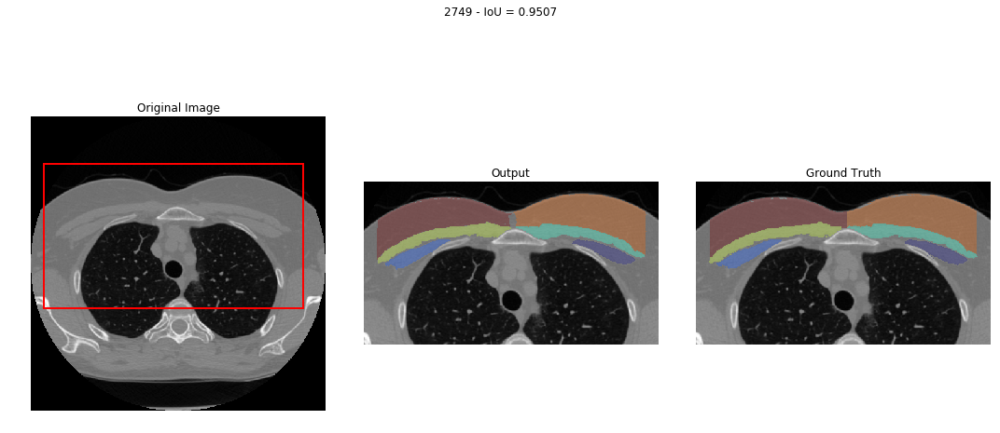

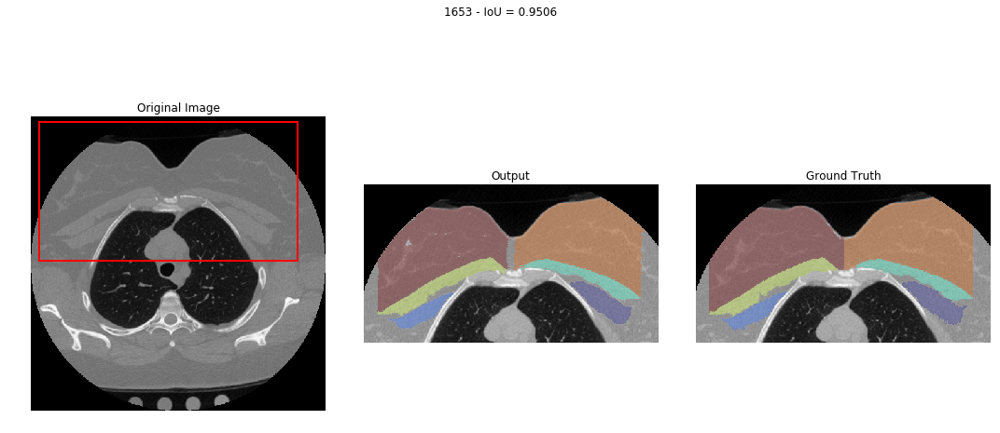

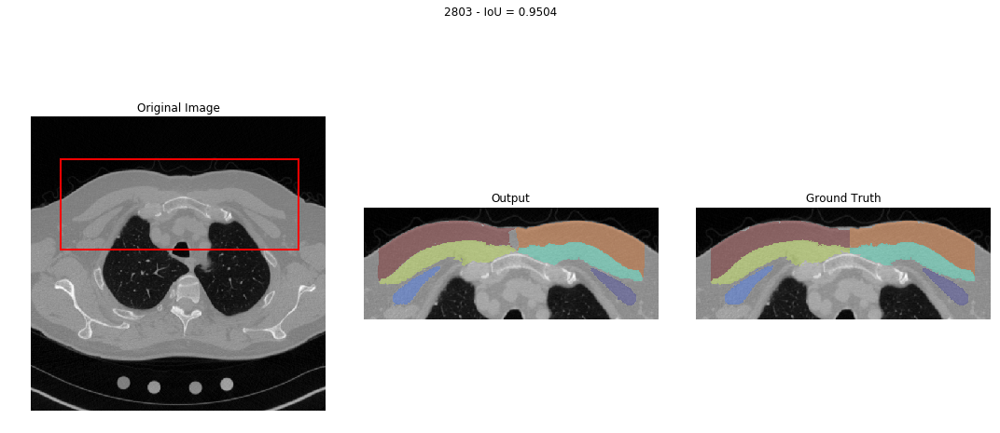

...

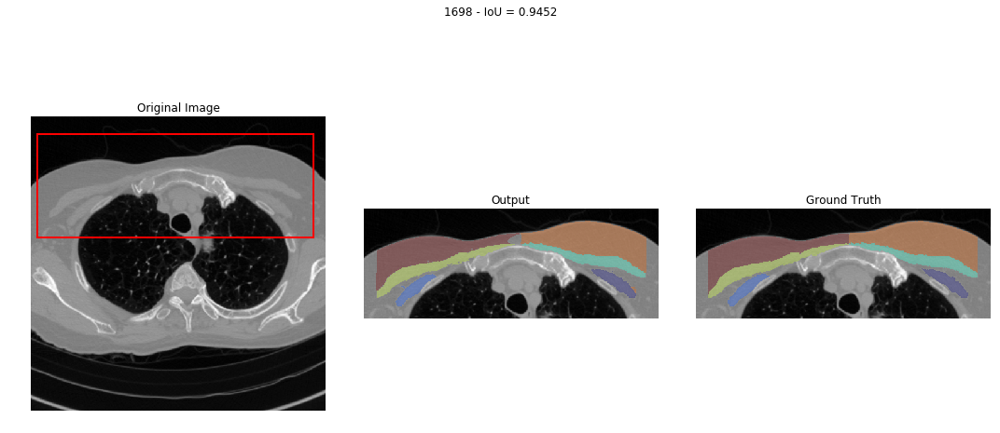

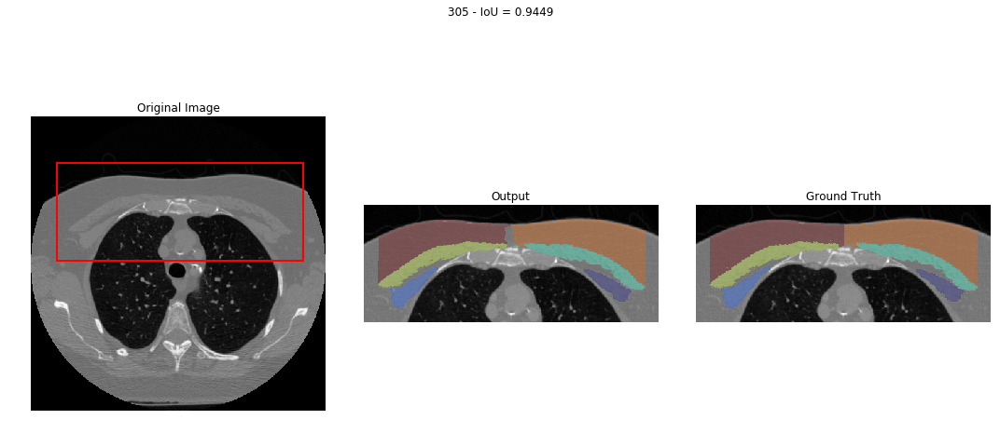

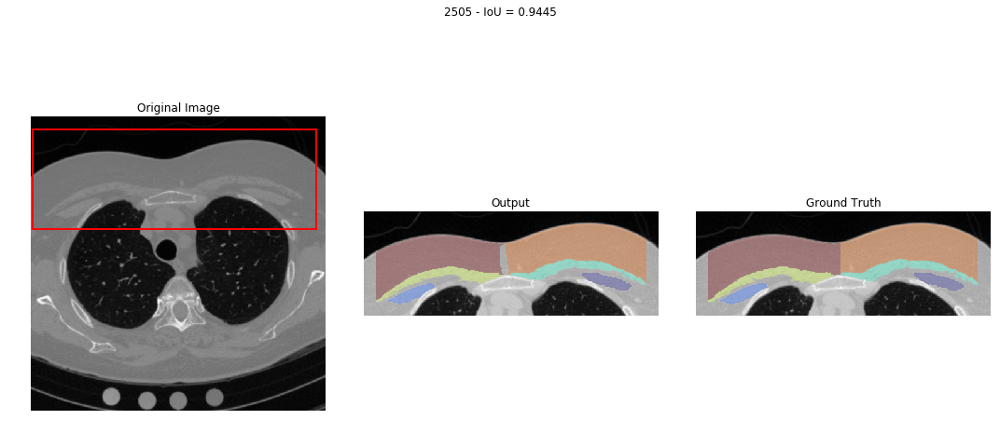

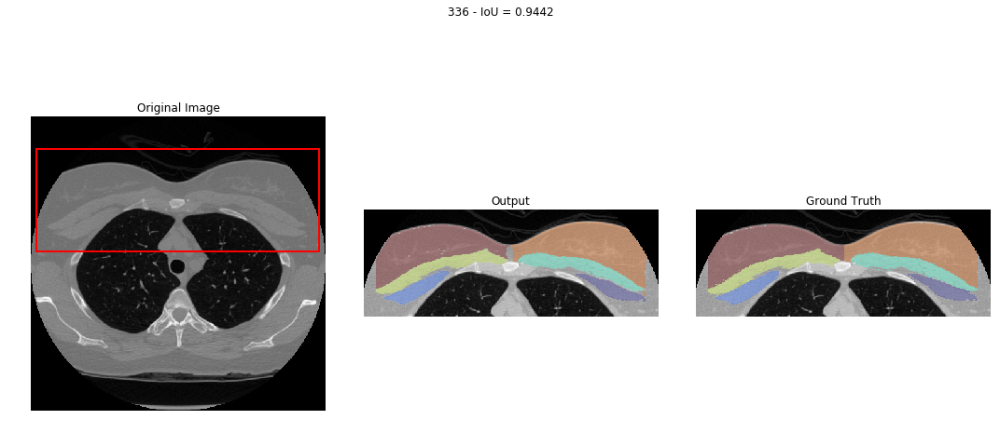

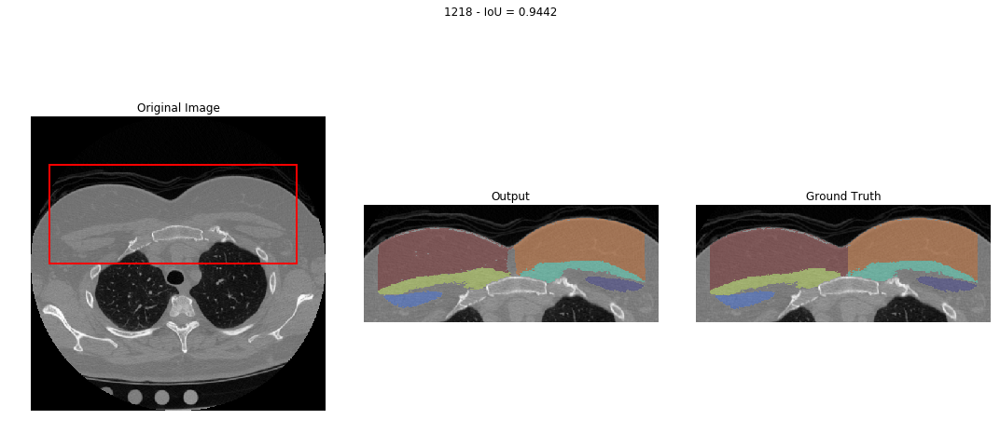

In [58]:
for i in images_good_classes[0:20]:
    
    margen = 20
    
    min_h, max_h, min_w, max_w = detect_min_max(labels[num_images_train+i,:,:], imgs_mask_pred_join[i,:,:], margen)
    
    r_coord_0 = (min_w, min_h)
    r_width = max_w-min_w
    r_hight = max_h-min_h
    r_coord_1 = (r_coord_0[0]+r_width, r_coord_0[1]+r_hight)
    
    r_index_i, r_index_j = np.ix_(range(r_coord_0[1], r_coord_0[1]+r_hight), range(r_coord_0[0], r_coord_0[0]+r_width))
    
    CT_test = imgs_test[i,:,:,0]
    CT_test_r = imgs_test[i,r_index_i,r_index_j,0]
    CNN = imgs_mask_pred_join[i,r_index_i,r_index_j]
    CNN_masked = np.ma.masked_where(CNN == 0, CNN)
    GT = labels[num_images_train+i,r_index_i,r_index_j]
    GT_masked = np.ma.masked_where(GT == 0, GT)   
    
    opacity = 0.3
    
    f, a = plt.subplots(1, 3, figsize=(15, 8))
    
    a[0].imshow(CT_test,cmap='Greys_r')
    rect = patches.Rectangle(r_coord_0, r_width, r_hight, linewidth=2, edgecolor='r', facecolor='none')
    a[0].add_patch(rect)
    
    a[1].imshow(CT_test_r,cmap='Greys_r')
    a[1].imshow(CNN_masked, 'jet',interpolation='none', alpha=opacity)
    a[2].imshow(CT_test_r,cmap='Greys_r')
    a[2].imshow(GT_masked, 'jet', interpolation='none', alpha=opacity)
    
    a[0].set_title('Original Image')
    a[1].set_title('Output')
    a[2].set_title('Ground Truth')
    
    a[0].axis('off')
    a[1].axis('off')
    a[2].axis('off')
    
    
    plt.suptitle(str(i) + ' - IoU = ' + str(acc_test_image_mean[i])[0:6])
    plt.tight_layout()
    acc_i = str(acc_test_image_mean[i])[2:4] + '\'' + str(acc_test_image_mean[i])[4:6]
    #plt.savefig(path_unet + 'figures/together/best/' + "fig_all_{}_{}.png".format(acc_i,i), bbox_inches='tight')
    #plt.draw()
    f.show()

---------------

In [50]:
labels.shape

(3000, 512, 512)

#### Edge

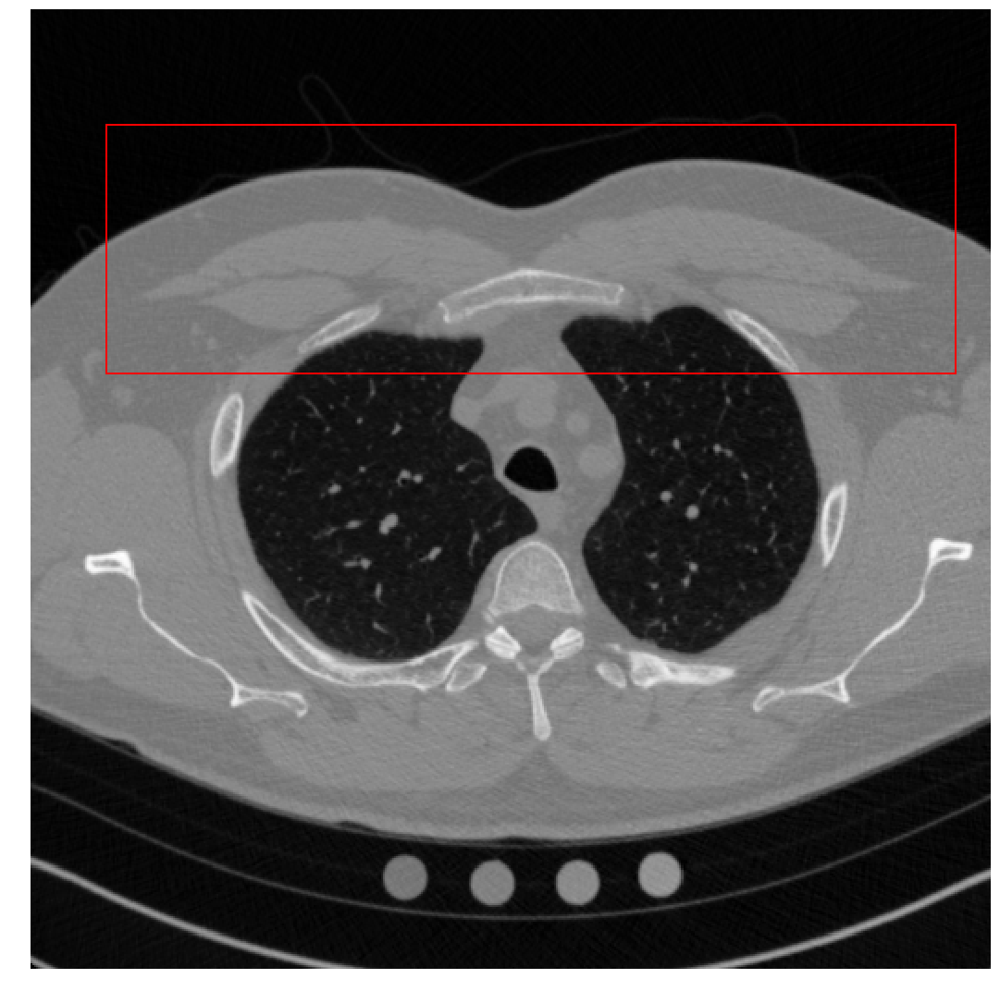

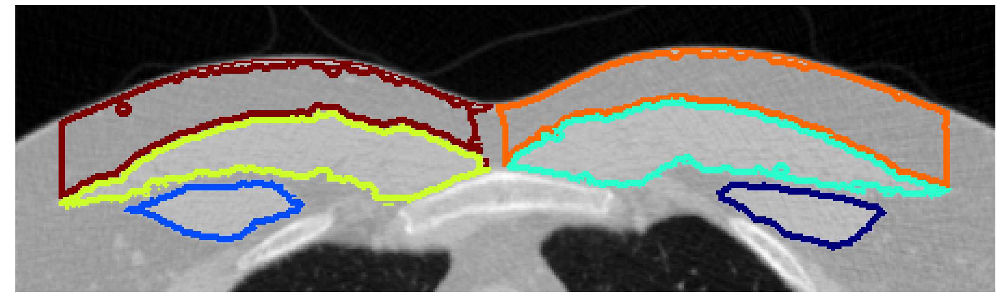

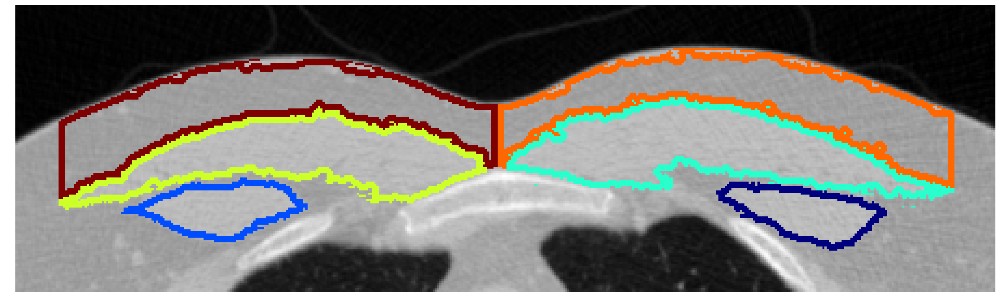

In [60]:
for i in [1817]:
    
    margen = 20
    
    min_h, max_h, min_w, max_w = detect_min_max(labels[num_images_train+i,:,:], labels[num_images_train+i,:,:], margen)
    
    r_coord_0 = (min_w, min_h)
    r_width = max_w-min_w
    r_hight = max_h-min_h
    
    r_index_i, r_index_j = np.ix_(range(r_coord_0[1], r_coord_0[1]+r_hight), range(r_coord_0[0], r_coord_0[0]+r_width))
    
    CT_test = imgs_test[i,:,:,0]
    CT_test_r = imgs_test[i,r_index_i,r_index_j,0]
    
    CNN = get_edge_classes(imgs_mask_pred[i], 3)[r_index_i,r_index_j]
    CNN_masked = np.ma.masked_where(CNN == 0, CNN)
    GT = get_edge_classes(imgs_mask_test[i], 3)[r_index_i,r_index_j]
    #GT = labels[num_images_train+i,r_index_i,r_index_j]
    GT_masked = np.ma.masked_where(GT == 0, GT)  
    
    opacity = 1
    
    acc_i = str(acc_test_image_mean[i])[2:4] + '\'' + str(acc_test_image_mean[i])[4:6]
    
    ## CT PLOT
    f, a = plt.subplots(1, 1, figsize=(15, 15))
    a.imshow(CT_test, cmap='Greys_r')
    rect = patches.Rectangle(r_coord_0, r_width, r_hight, linewidth=2, edgecolor='r', facecolor='none')
    a.add_patch(rect)
    a.axis('off')
    #a.set_title('CT ZOOM')
    plt.tight_layout()
    plt.savefig(path_figure + "fig_{}_{}_CT_edge.png".format(acc_i,i), bbox_inches='tight')
    f.show()
    
    ## ZOOM PLOT CNN
    f, a = plt.subplots(1, 1, figsize=(30, 15)) 
    a.imshow(CT_test_r,cmap='Greys_r')
    a.imshow(CNN_masked, 'jet',interpolation='none', alpha=1)
    #a.set_title('CT ZOOM')
    a.axis('off')
    plt.tight_layout()
    plt.savefig(path_figure + "fig_{}_{}_CNN_edge.png".format(acc_i,i), bbox_inches='tight')
    f.show()
    
    ## ZOOM PLOT GT
    f, a = plt.subplots(1, 1, figsize=(30, 15))
    a.imshow(CT_test_r,cmap='Greys_r')
    a.imshow(GT_masked, 'jet', interpolation='none', alpha=opacity)
    #a.set_title('CT ZOOM')
    a.axis('off')
    plt.tight_layout()
    plt.savefig(path_figure + "fig_{}_{}_GT_edge.png".format(acc_i,i), bbox_inches='tight')
    f.show()


--------

** Accuracy over all test images**

In [28]:
def accuracy_IoU_np_all(y_true, y_pred):
    tp = np.sum(y_true * y_pred)
    fn = np.sum((y_true + y_pred)*y_true) - tp*2.
    fp = np.sum((y_true + y_pred)*y_pred) - tp*2.
    
    #beta = 1
    #F_b = ((1+np.power(beta,2))*tp)/((1+np.power(beta,2))*tp + np.power(beta,2)*fn + fp)
    IoU = (tp)/(tp + fn + fp)
    
    return IoU

In [29]:
def accuracy_IoU_np(y_true, y_pred):
    axis = np.array((2,1,0))
    tp = np.apply_over_axes(np.sum,(y_true * y_pred), axes=axis)
    fn = np.apply_over_axes(np.sum,((y_true + y_pred)*y_true), axes=axis) - tp*2.
    fp = np.apply_over_axes(np.sum,((y_true + y_pred)*y_pred), axes=axis) - tp*2.
    
    #beta = 1
    #F_b = ((1+np.power(beta,2))*tp)/((1+np.power(beta,2))*tp + np.power(beta,2)*fn + fp)
    IoU = (tp)/(tp + fn + fp)
    return IoU

In [ ]:
th = 0.5
#imgs_mask_pred = np.load('imgs_mask_pred_test.npy')
#imgs_mask_pred[(imgs_mask_pred>th)] = 1
#imgs_mask_pred[(imgs_mask_pred<th)] = 0

acc_test = accuracy_IoU_np(imgs_mask_test,imgs_mask_pred)
acc_test = acc_test[0,0,0,:]

#print(acc_test)
for i in range(num_classes):
    print(('Test Accuracy Class ' + str(i) + ': '), acc_test[i])
print('Test Accuracy Class Mean ', np.mean(acc_test))
print('Test Accuracy Over all ', accuracy_IoU_np_all(imgs_mask_test,imgs_mask_pred))

# PLot
ind = np.arange(num_classes)  # the x locations for the groups
width = 0.35       # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(ind, acc_test, width, color='r')

# add some text for labels, title and axes ticks
ax.set_ylabel('Accuracy [%]')
ax.set_title('Accuracy by Class')
ax.set_xticks(ind+width/2.)
ax.set_xticklabels(('C0', 'C1', 'C2', 'C3', 'C4'))
plt.show()
#fig.savefig('Figures/Multiclass/c5_accuracy_images_barchar.png')

**Accuracy over each test image**

In [17]:
def accuracy_IoU_np_individual(y_true, y_pred):
    axis = np.array((1,2))
    tp = np.apply_over_axes(np.sum,(y_true * y_pred), axes=axis)
    fn = np.apply_over_axes(np.sum,((y_true + y_pred)*y_true), axes=axis) - tp*2.
    fp = np.apply_over_axes(np.sum,((y_true + y_pred)*y_pred), axes=axis) - tp*2.
    
    #beta = 1
    #F_b = ((1+np.power(beta,2))*tp)/((1+np.power(beta,2))*tp + np.power(beta,2)*fn + fp)
    IoU = (tp)/(tp + fn + fp)
    
    return IoU

In [ ]:
def accuracy_IoU_np_individual(y_true, y_pred):
    axis = np.array((1,2))
    tp = np.apply_over_axes(np.sum,(y_true * y_pred), axes=axis)
    fn = np.apply_over_axes(np.sum,((y_true + y_pred)*y_true), axes=axis) - tp*2.
    fp = np.apply_over_axes(np.sum,((y_true + y_pred)*y_pred), axes=axis) - tp*2.
    
    #beta = 1
    #F_b = ((1+np.power(beta,2))*tp)/((1+np.power(beta,2))*tp + np.power(beta,2)*fn + fp)
    IoU = (tp)/(tp + fn + fp)
    
    return IoU

In [14]:
imgs_mask_test = imgs_mask_test[:,:,:,range(1,7)]

[ 0.73382473  0.84423676  0.84030132  0.86252189  0.93262482  0.79021716]
('Test Accuracy Class 0: ', 0.8133660923175654)
('Test Accuracy Class 1: ', 0.82259841766364172)
('Test Accuracy Class 2: ', 0.86468588183912021)
('Test Accuracy Class 3: ', 0.88222249076100645)
('Test Accuracy Class 4: ', 0.90006344007513384)
('Test Accuracy Class 5: ', 0.88278772055559451)


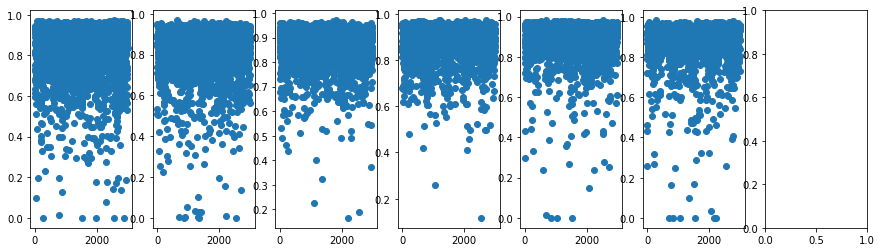

In [26]:
th = 0.5
#imgs_mask_pred = np.load('imgs_mask_pred_test.npy')
#imgs_mask_pred[(imgs_mask_pred>th)] = 1
#imgs_mask_pred[(imgs_mask_pred<th)] = 0

acc_test_image = accuracy_IoU_np_individual(imgs_mask_test[0:3000],imgs_mask_pred[0:3000])
print(acc_test_image[1,0,0,:])

## Plot 
#images = np.arange(num_images_test)
images = np.arange(3000)
f, a = plt.subplots(1, num_classes, figsize=(15, 4))
for i in range(num_classes-1):
    # Class i
    a[i].plot(images,acc_test_image[:,0,0,i], 'o')
    #a[i].xlabel('Test Images')
    #a[i].ylabel(('Accuracy Class ' + str(i)))
    #a[i].title('Accuracy for each Test Image')
    f.show()
    print(('Test Accuracy Class ' + str(i) + ': '), np.mean(acc_test_image[:,0,0,i]))
#f.savefig('Figures/Multiclass/c5_accuracy_images.png')

In [51]:
acc_test_image = acc_test_image[:,0,0,:]
np.save(path_unet + 'acc_test_image.npy', acc_test_image)

In [ ]:
## Plot 
#images = np.arange(num_images_test)
images = np.arange(1000)
f, a = plt.subplots(1, num_classes, figsize=(15, 4))
for i in range(num_classes):
    # Class i
    a[i].plot(images,acc_test_image[:,0,0,i], 'o')
    #a[i].xlabel('Test Images')
    #a[i].ylabel(('Accuracy Class ' + str(i)))
    #a[i].title('Accuracy for each Test Image')
    f.show()
    print(('Test Accuracy Class ' + str(i) + ': '), np.mean(acc_test_image[:,0,0,i]))
#f.savefig('Figures/Multiclass/c5_accuracy_images.png')

In [140]:
np.mean(acc_test_image[:,0])

0.8133660923175654

In [141]:
acc_test_image_mean.shape

(3000,)

In [147]:
acc_test_image_mean_all = np.mean(acc_test_image,axis=0)

xticklabels_ = ('Left Minor Pec', 'Right Minor Pec', 'Left Major Pec', 'Right Major Pec', 'Left Fat', 'Right Fat')
xticklabels = list()
for i in range(6):
    xticklabels.append(xticklabels_[i] + '\n\n' + str(acc_test_image_mean_all[i]))
xticklabels = tuple(xticklabels)

In [196]:
np.save(path_unet + 'num_outlayers.npy', num_outlayers)

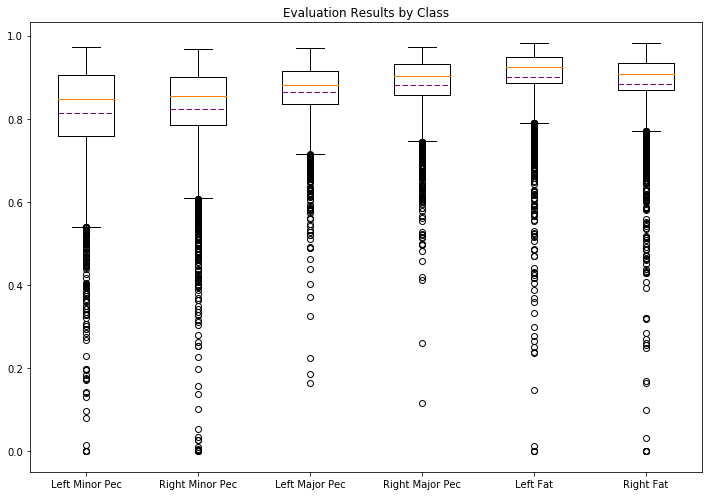

In [209]:
f, a = plt.subplots(1, 1, figsize=(10, 7))
meanlineprops = dict(linestyle='--', linewidth=1, color='purple')
r = a.boxplot(acc_test_image, meanprops=meanlineprops, meanline=True,
                   showmeans=True)

## ticklabels

xticklabels_ = ('Left Minor Pec', 'Right Minor Pec', 'Left Major Pec', 'Right Major Pec', 'Left Fat', 'Right Fat')


a.set_xticklabels(xticklabels_)
plt.title('Evaluation Results by Class')
plt.tight_layout()
plt.savefig(path_unet + "fig_1_normal.png", bbox_inches='tight')
plt.show()


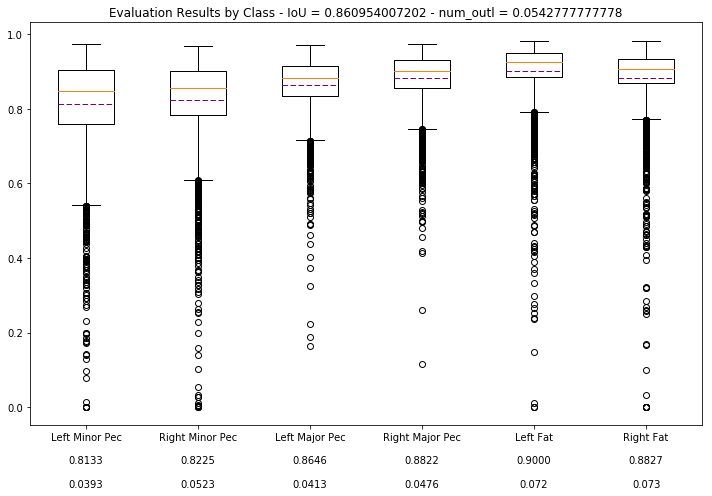

In [212]:
f, a = plt.subplots(1, 1, figsize=(10, 7))
meanlineprops = dict(linestyle='--', linewidth=1, color='purple')
r = a.boxplot(acc_test_image, meanprops=meanlineprops, meanline=True,
                   showmeans=True)

## ticklabels
acc_test_image_mean_all = np.mean(acc_test_image,axis=0)
num_outlayers = list()
for i in range(6):
    num_outlayers.append(len(r["fliers"][i].get_data()[1])/3000.)

xticklabels_ = ('Left Minor Pec', 'Right Minor Pec', 'Left Major Pec', 'Right Major Pec', 'Left Fat', 'Right Fat')
xticklabels = list()
for i in range(6):
    xticklabels.append(xticklabels_[i] + '\n\n' + str(acc_test_image_mean_all[i])[0:6] + '\n\n' + str(num_outlayers[i])[0:6])
xticklabels = tuple(xticklabels)



a.set_xticklabels(xticklabels)
plt.title('Evaluation Results by Class - IoU = ' + str(np.mean(acc_test_image_mean_all)) + ' - num_outl = ' + str(np.mean(num_outlayers)))
plt.tight_layout()
plt.savefig(path_unet + "fig_1_allData.png", bbox_inches='tight')
plt.show()


In [55]:
# Class 1
condition = acc_test_image[:,1]<0.1
images_bad_c1 = np.where(condition)[0]
images_bad = np.where(condition)[0]
#print(images_bad_c1)

# Images over all classes
acc_test_image_mean = np.mean(acc_test_image,axis=1)
num_images = 100
images_good_classes_val = np.sort(acc_test_image_mean)[::-1][0:num_images]
images_good_classes = np.argsort(acc_test_image_mean)[::-1][0:num_images]
                                 
#condition = acc_test_image_mean>0.955
#images_good_classes = np.where(condition)[0]

num_images = 100
images_bad_classes_val = np.sort(acc_test_image_mean)[0:num_images]
images_bad_classes = np.argsort(acc_test_image_mean)[0:num_images]

print images_good_classes
print images_bad_classes

[ 455 1650 2749 1653 2803   79 1792   19 1759  632 2900 1817 2972 1042   75
 1698  305 2505  336 1218 1283 1163 1921 2831 2279 2442 1762 1038 1032 2409
  480 2486  705  385  955 1175 1284  645 1396  402 2183 2403 1985 1474 1979
 2263 1014 2225  512 2516 1612 1351 1808 1401 2273 2672 1550 2497  569   55
 2419 1499  581  525 1781 1155  304 2854  898 2317 2866 2441 1580 2813   86
  572 1324   16  927 2211 1001 2694  856 1756 1291 1292 2295  667 2400 1936
  122 1788 1188 2284 1026 1363 1830  687    0 1680]
[2557 1052  783 1094 1423 2635  894 2071  317  700  217 1531 2226 1539 2197
 2103   38 1341  583  100 1323  255  657 2735 1542  797 2521 2351 1590 1511
  719 1991   10 1892 1045  701 2314  706 2013 2963  884  973 1544  847 1543
 1909 1360  782 1430    5 1826  273  789 2787 2679 1296 2584  409 1684 2846
    9  333  540  986 2740 2224 2891 2146 2677 1996 1721 2763 1180 1605  862
  224 1745 2305  855 2112  221 2427 2299 2091  806  774   54  877 1687  165
 1757 2017 1912  131 1737 2206 2827 